In [1]:
#Import packages
import osmnx as ox
import networkx as nx
import geopandas as gpd
import pandas as pd
from shapely.geometry import Point

In [2]:
#Load in the NC road network
nc_graph = ox.load_graphml('NC_roads.graphml',folder='../Data/OSM/')

In [3]:
nc_graph

In [4]:
#Load in the DCFC locations as pandas dataframe
dcfc_df = pd.read_csv('../Data/NREL/DCFC.csv')

In [7]:
#Convert to a geopandas dataframe
geom_points = [Point(xy) for xy in zip(dcfc_df['longitude'],dcfc_df['latitude'])]

In [8]:
dcfc_gdf = gpd.GeoDataFrame(dcfc_df,geometry=geom_points,crs=4326)

In [10]:
#Load exits as a geopandas dataframe
exits_gdf = gpd.read_file('../Data/MJBA/MJBA_Exits.shp')

**link exits and DCFC feature to their corresponding node in the road net work**

In [11]:
#Define a function to extract the nearest node ID for a point object
def get_nodeid(thePoint):
    #Get the yx tuple
    yx = (thePoint.y,thePoint.x)
    #Fetch the node nearest the xy tuple
    node_id = ox.get_nearest_node(nc_graph,yx)
    #Return the node id
    return node_id

In [12]:
#Apply the function to each point in the DCFC geodataframe, adding node ID as a column
dcfc_gdf['node_id'] = dcfc_gdf['geometry'].apply(get_nodeid)

In [13]:
#Apply the function to each point in the Exits geodataframe, adding node ID as a column
exits_gdf['node_id'] = exits_gdf['geometry'].apply(get_nodeid)

In [14]:
#Create unique lists from the values, for later use
nodes_dcfc = dcfc_gdf['node_id'].unique()
nodes_exits = exits_gdf['node_id'].unique()

**Compute the distance**

In [20]:
#Extract an example start node: fetching the first one in the nodes_dcfc list
theStartNode = nodes_dcfc[0]
theStartNode

169672458

In [25]:
#Extract the path (set of nodes) within 100 miles of the source node
thePaths = nx.single_source_dijkstra_path(G=nc_graph,
                                          source=theStartNode,
                                          weight='length',
                                          cutoff=100 * 1609.34)

In [26]:
type(thePaths)

dict

In [27]:
thePaths

{169672458: [169672458],
 169630691: [169672458, 169630691],
 169672461: [169672458, 169672461],
 5567900585: [169672458, 169672461, 5567900585],
 5567900513: [169672458, 169672461, 5567900513],
 169673308: [169672458, 169672461, 5567900585, 169673308],
 5567900584: [169672458, 169672461, 5567900585, 5567900584],
 5567900525: [169672458, 169672461, 5567900513, 5567900525],
 169693166: [169672458, 169672461, 5567900513, 169693166],
 169672481: [169672458, 169672461, 5567900513, 5567900525, 169672481],
 3858965226: [169672458,
  169672461,
  5567900513,
  5567900525,
  169672481,
  3858965226],
 169672479: [169672458,
  169672461,
  5567900513,
  5567900525,
  169672481,
  169672479],
 3858965234: [169672458,
  169672461,
  5567900513,
  5567900525,
  169672481,
  3858965226,
  3858965234],
 169630211: [169672458,
  169672461,
  5567900513,
  5567900525,
  169672481,
  3858965226,
  3858965234,
  169630211],
 169673310: [169672458, 169672461, 5567900585, 169673308, 169673310],
 169634378

In [22]:
#Reveal the nodes involved in getting from the source to node 169634378
thePaths[169634378]

[169672458, 169672461, 5567900585, 169673308, 169634378]

In [23]:
#From that we can create a subgraph
subgraph = nx.subgraph(nc_graph,thePaths[169634378])

In [24]:
#And we can plot that subgraph
ox.plot_graph_folium(subgraph)

In [28]:
#Extract all paths and plot (this takes a moment...)
subgraph = nx.subgraph(nc_graph,thePaths.keys())
ox.plot_graph_folium(subgraph)

In [29]:
#Compute distance to other nodes, with cutoff of 100 miles
theDistances = nx.single_source_dijkstra_path_length(G = nc_graph,
                                                     source = theStartNode,
                                                     cutoff = 100*1609.34,
                                                     weight = 'length')

dict

In [31]:
type(theDistances)

dict

In [32]:
theDistances

{169672458: 0,
 169672461: 13.607,
 5567900585: 25.854999999999997,
 5567900584: 40.096,
 5567900513: 395.961,
 5567900525: 410.576,
 169672481: 420.76300000000003,
 169672479: 435.70900000000006,
 3858965226: 472.298,
 3858965234: 520.381,
 169673308: 525.687,
 169673310: 538.2570000000001,
 169673561: 553.3320000000001,
 169693166: 559.183,
 169673558: 564.5630000000001,
 169634378: 638.83,
 169630211: 646.977,
 169634373: 653.8100000000001,
 169630208: 660.843,
 169673322: 680.308,
 169775337: 707.44,
 4156063181: 784.1179999999999,
 4156063180: 798.611,
 2643999468: 850.954,
 2643999471: 935.2199999999999,
 169640837: 946.3779999999999,
 169666712: 957.7429999999999,
 4053203992: 962.8279999999999,
 169673325: 1104.031,
 169673574: 1117.011,
 2643999464: 1153.085,
 169630766: 1263.3899999999999,
 169630763: 1277.3269999999998,
 169673336: 1458.8809999999999,
 169673580: 1472.791,
 169649255: 1686.2589999999998,
 169649257: 1700.0769999999998,
 4053203994: 2038.763,
 3783446950: 205

In [30]:
theDistances[169634378]

638.83

In [33]:
#Create a dataframe of the distances, and plot in miles
df = pd.DataFrame()                     #Create an empty dataframe
df['node_id']=theDistances.keys()       #Add the node_ids to the dataframe
df['distance'] = theDistances.values()  #Add the distances (in meters) to the dataframe
df['distance'] = df['distance']/1609.34 #Convert distances to miles
df.head()

,node_id,distance
0,169672458,0.000000
1,169672461,0.008455
2,5567900585,0.016066
3,5567900584,0.024915
4,5567900513,0.246039


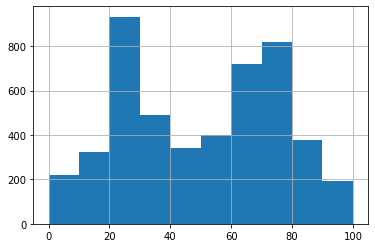

In [34]:
#Plot a histogram
df['distance'].hist();

In [35]:
#Compute all pairs lengths
allDistPairs = nx.all_pairs_dijkstra_path_length(nc_graph,cutoff=100*1609.34,weight='length')

In [36]:
type(allDistPairs)

generator

In [38]:
#Loop through the results and extract the distances associated with DCFC nodes
distance_data = {}
for distItem in allDistPairs:
    #Get the items in the tuple
    startNode_id = distItem[0]
    path_data = distItem[1]
    #Check to see if StarNode is a DCFC node
    if startNode_id in nodes_dcfc:
        #Get a list of endnodes from the path_data object
        endNodes = set(path_data.keys())
        #Get nodes that are also exits
        valid_endNodes = endNodes.intersection(set(nodes_exits))
        #See if the intersection has any members
        for node in valid_endNodes:
            #Get the distance associated with the node
            theDistance = path_data[node]
            #See if node already has recorded distance
            if node in distance_data.keys():
                #If so, compare existing distance to new distance
                if distance_data[node] >= distance_data[node]:
                    distance_data[node] = distance_data[node] #If it's greater, update with smaller
            else:
                distance_data[node] = theDistance  #If the node has not yet been added, add it

In [39]:
#Convert to a dataframe
df_distance = pd.DataFrame()
df_distance['node_id'] = distance_data.keys()
df_distance['distance'] = distance_data.values()
df_distance['distance'] = df_distance['distance'] / 1609.34
df_distance.head()

,node_id,distance
0,195770883,40.197373
1,195397123,82.725966
2,373638664,94.883091
3,3115819531,80.805945
4,3737060875,41.296973


In [40]:
#Join the data to the exits data
exits_gdf1 = pd.merge(left=exits_gdf,    #"Left" side dataframe of the merge
                      right=df_distance, #"Right" side dataframe of the merge
                      left_on='node_id', #Attribute on the left dataframe used to join the frames
                      right_on='node_id',#Attribute on the right dataframe used to join the frames
                      how='left')        #Type of join: "left" keeps all records in left dataframe  

In [42]:
#Save the data to a shapefile
exits_gdf1.to_file('../Data/Processed/exits_distance.shp')

**Visualization**

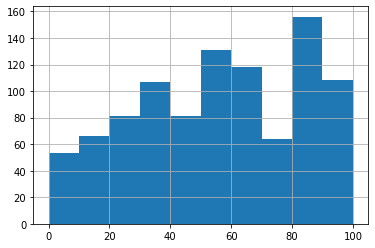

In [43]:
#Plot a histogram of distances
exits_gdf1['distance'].hist(bins=10);

In [44]:
#Create a list of exit colors, for plotting
exit_colors = []
for d in exits_gdf1['distance']:
    if d < 50: exit_colors.append('grey')  #Show exits <50 miles from DCFC as grey
    else: exit_colors.append('red')        #Show all other exits as red

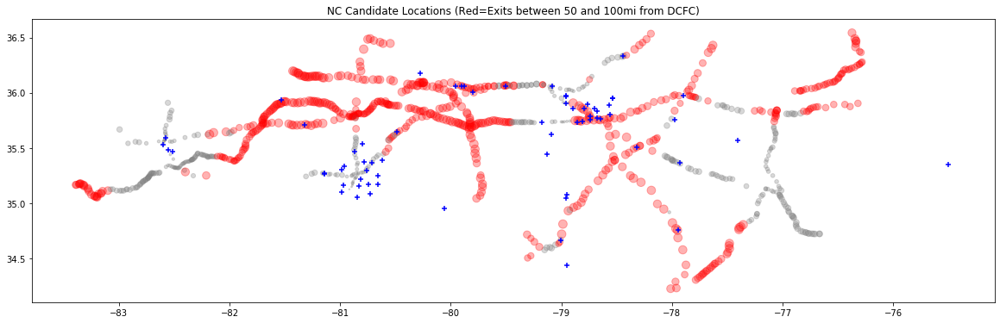

In [45]:
#Plot exits and charger locations
ax = exits_gdf1.plot(markersize='distance', #Make further exits larger
                     figsize=(20,15),       #Size of figure
                     color=exit_colors,     #Use colors set above
                     alpha=0.3)             #Set to mostly transparent
ax.set_title("NC Candidate Locations (Red=Exits between 50 and 100mi from DCFC)")

#Add the DCFC locations as small blue crosses
dcfc_gdf.plot(color='blue',marker='+',ax=ax)